##Τεχνολογία και Ανάλυση Εικόνας και Βίντεο
##1η ομαδική άσκηση
<br> 
###Αστρινάκης Νικόλαος el17008
###Ταμπακάκης Χρήστος el17042

##1. Θεωρητικό Μέρος

###**α) Ποιο είναι το πρόβλημα και ποιες οι κύριες ιδέες που πραγματεύεται το άρθρο αυτό;**

Το βασικό πρόβλημα που αναλύει το άρθρο, είναι το γεγονός ότι τα γειτονικά pixel μίας εικόνας είναι συσχετισμένα μεταξύ τους, οπότε κατά τη κωδικοποίηση της εικόνας, ένα μεγάλο κομμάτι της πληροφορίας που κωδικοποιείται είναι περιττό, αφού υπάρχει και στους γείτονες του κάθε pixel.

Η λύση αυτού του προβήματος είναι να βρούμε τρόπο να αποσυσχετίσουμε τα pixels, ώστε να γίνεται αποδοτική αποκωδικοποίηση χωρίς επανάληψη πληροφορίας. Το άρθρο αναλύει τη χρήση ενός kernel που κάνει συνέλιξη με την εικόνα, λειτουργώντας σαν low pass filter και στη συνέχεια τη χρήση subsampling ώστε να καταλήξουμε σε μικρότερη εικόνα, διαδικασία η οποία μπορεί να επαναληφθεί μέχρι να αποκτήσουμε το επιθυμητό μέγεθος.

Η αφαίρεση της expanded low pass filtered εικόνας από την εικόνα στην οποία εφαρμόστηκε το φίλτρο μας δίνει το error image που χρησιμοποιείται για την ανακατασκευή της αρχικής εικόνας. Τέλος, κρατάμε μόνο την πυραμίδα από τα error images και έτσι έχουμε κάνει compress την εικόνα.

###**β) Ποιος είναι ο σκοπός του φίλτρου Gauss στην κατασκευή της πυραμίδας; Τι θα συνέβαινε αν χρησιμοποιούσαμε μόνο υποδειγματοληψία;**

Ο σκοπός του φίλτρου Gauss είναι να συμπιέσουμε την πληροφορία των γειτόνων κάθε pixel και του pixel του ίδιου σε ένα. Αυτό μας βοηθάει γιατί έτσι, όταν γίνει subsampling τα pixels που θα μείνουν από την εικόνα θα περιέχουν ακόμα πληροφορία από τους γείτονές τους και έτσι δεν χάνουμε σημαντικές πληροφορίες της εικόνας.

Άν γινόταν μόνο χρήση subsampling, τότε θα αφαιρούσαμε πληροφορία από την εικόνα η οποία δεν υπάρχει σε κάποιο άλλο pixel, και έτσι θα χανόταν από την εικόνα. Επομένως, έχουμε απώλεια πληροφορίας και κατά συνέπεια δυσκολία στην ανακατασκευή της εικόνας, άν αυτή χρειαστεί.



###**γ) Πώς χρησιμοποιείται η πυραμίδα Laplacian για την επίλυση του προβλήματος που αναφέρεται στο άρθρο; Γιατί αυτή η αναπαράσταση εικόνας είναι καλύτερη από την πυραμίδα Gauss στο πλαίσιο της εργασίας που διαπραγματεύεται το άρθρο;**

Η πυραμίδα Laplacian αποτελείται από τα error images που προκύπτουν κατά το encoding. Η πυραμίδα αυτή συμβάλλει στην επίλυση του προβλήματος καθώς επιτρέπει πολύ καλή συμπίεση των δεδομένων που χρειάζονται για να γίνεται ανακατασκευή της αρχικής εικόνας.

Η αναπαράσταση αυτή έχει το πλεονέκτημα σε σχέση με τη Gauss ότι περιέχει πολύ λιγότερα δεδομένα και ανακατασκευάζει την αρχική εικόνα με πολύ καλή ακρίβεια.



###**δ) Περιγράψτε πώς να ανακτήσετε την εικόνα χρησιμοποιώντας μόνο την πυραμίδα Laplacian. Διατυπώστε την απάντησή σας χρησιμοποιώντας μια εξίσωση που περιγράφει αυτήν τη διαδικασία. Θα μπορέσουμε να ανακτήσουμε τέλεια την αρχική εικόνα;**

Για να ανακτήσουμε την εικόνα χρησιμοποιώντας μόνο την πυραμίδα Laplacian, κάνουμε expand το N-οστό επίπεδο της πυραμίδας και το προσθέτουμε στο προηγούμενο, συνεχίζοντας διαδοχικά μέχρι να φτάσουμε στο κατώτατο επίπεδο της πυραμίδας.

Δηλαδή $g_0 = \sum_{i=0}^{N} L_{i,i}$.

Με τη διαδικασία αυτή, καταφέρνουμε τέλεια ανάκτηση της αρχικής εικόνας.

##2. Εργαστηριακό Μέρος

###Α. Υλοποίηση Αλγορίθμου

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import math

In [ ]:
def GKernel(a):
  w = [0.25-a/2, 0.25, a, 0.25, 0.25-a/2]
  res = np.zeros((5,5), dtype=np.float64)
  for i in range(-2,3):
    for j in range(-2,3):
      res[2+i][2+j] = w[i+2]*w[j+2]
  return res

In [ ]:
def GREDUCE(src, kernel):
  #convolute image and kernel
  dst = cv.filter2D(src, -1, kernel, (0,0))
  
  scale_percent = 50 # percent of original size
  width = int(src.shape[1] * scale_percent / 100)
  height = int(src.shape[0] * scale_percent / 100)
  dim = (width, height)
  
  # resize image
  resized = cv.resize(dst, dim, interpolation = cv.INTER_AREA)
  
  return resized  

In [ ]:
def GPyramid(I, a, depth):
  res = [I]
  h = GKernel(a)
  prev = I
  for i in range(depth):
    new = GREDUCE(prev, h)
    res.append(new)
    prev = new
  return res

In [ ]:
def GEXPAND(src, kernel):
  exp = None
  if (len(src.shape) == 2):
    tmp = np.zeros((src.shape[0]*2, src.shape[1]*2), dtype = np.uint8)
    tmp[::2,::2] = src
  else :
    tmp = np.zeros((src.shape[0]*2, src.shape[1]*2, src.shape[2]), dtype=np.uint8)
    tmp[::2,::2,:] = src
    exp = np.zeros((src.shape[0]*2, src.shape[1]*2, src.shape[2]), dtype=np.uint8)
  exp = 4*cv.filter2D(tmp, -1, kernel)
  return exp

In [ ]:
def LPyramid(I, a, depth):
  h = GKernel(a)
  res = []
  gauss = GPyramid(I, a, depth)
  for i in range(len(gauss) - 1):
    exp = GEXPAND(gauss[i + 1], h)
    res.append(gauss[i] - exp + 128)
  res.append(gauss[len(gauss) - 1])
  return res

In [ ]:
def L_Pyramid_Decode(L, a):
  h = GKernel(a)
  depth = len(L)
  exp = [L[depth-1]]
  #plt.figure(figsize=(30,30))

  for i in range(depth - 2, -1, -1):
    exp.insert(0, GEXPAND(exp[0], h))
    exp[0] = exp[0] + L[i] - 128
  return exp

In [ ]:
def L_Quantization(L, n):
  b = 256//n

  def rnd(y, m):
    y = y / m
    r = round(y)
    if y - r > 0.5:
      return (r + 1) * m
    else :
      return r * m

  x = len(L)
  res = []
  for i in range(x):
    y = len(L[i])
    z = len(L[i][0])
    
    tmp = np.zeros(L[i].shape, dtype=np.uint8)
    for j in range(y):
      for k in range(z):
        if len(L[i].shape) == 3:
          w = len(L[i][0][0])
          for l in range(w):
            tmp[j][k][l] = rnd(L[i][j][k][l], b)
        else:
          tmp[j][k] = rnd(L[i][j][k], b)
    res.append(tmp)
    n = (2 * n) // 1
    if n < 256:
      b = 256//n
  return res

###B. Δοκιμές Αλγορίθμου

####α) Επίδειξη `LPyramid()` και `L_Pyramid_Decode()`

Πρέπει να έχει ανέβει η εικόνα **Lena** σε ένα αρχείο με όνομα *lena.png* για να μπορέσει να τρέξει ο κώδικας από εδώ και κάτω

In [ ]:
from skimage import data as dt

raw1 = cv.imread('lena.png')
img = cv.cvtColor(raw1, cv.COLOR_BGR2RGB)
img2 = dt.camera()

In [ ]:
pyr1 = LPyramid(img, 0.4, 4)
pyr2 = LPyramid(img2, 0.4, 4)

dec1 = L_Pyramid_Decode(pyr1, 0.4)[0]
dec2 = L_Pyramid_Decode(pyr2, 0.4)[0]

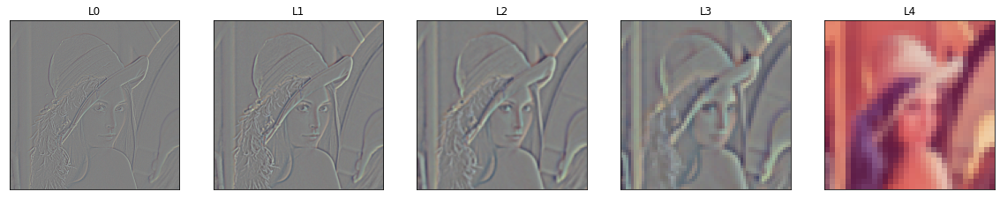

In [ ]:
plt.figure(figsize = (20,20))
for i in range (len(pyr1)):
  plt.subplot(1, len(pyr1), i + 1),plt.imshow(pyr1[i]),plt.title('L' + str(i))
  plt.xticks([]), plt.yticks([])
plt.show()

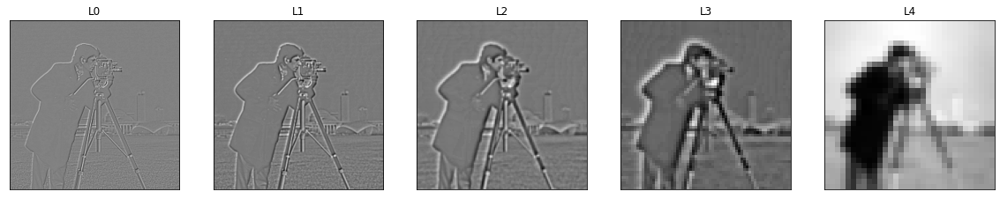

In [ ]:
plt.figure(figsize = (20,20))
for i in range (len(pyr2)):
  plt.subplot(1, len(pyr2), i + 1),plt.imshow(pyr2[i], cmap='gray'),plt.title('L' + str(i))
  plt.xticks([]), plt.yticks([])
plt.show()

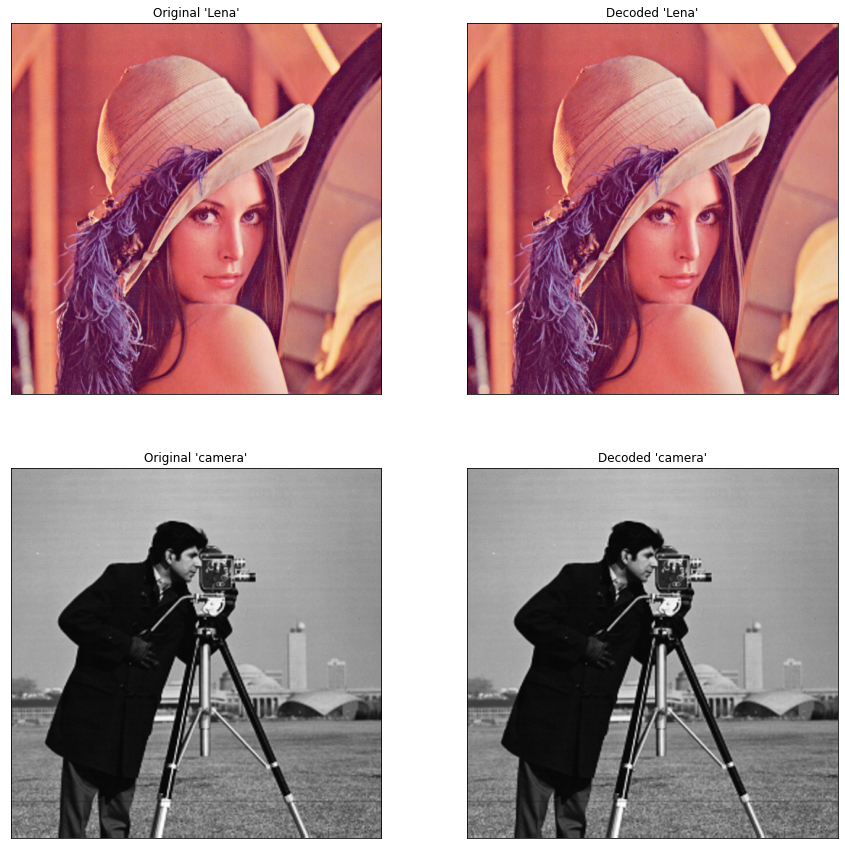

In [ ]:
plt.figure(figsize=(15,15))

plt.subplot(221),plt.imshow(img),plt.title("Original 'Lena'")
plt.xticks([]), plt.yticks([])

plt.subplot(222),plt.imshow(dec1),plt.title("Decoded 'Lena'")
plt.xticks([]), plt.yticks([])

plt.subplot(223),plt.imshow(img2, cmap='gray'),plt.title("Original 'camera'")
plt.xticks([]), plt.yticks([])

plt.subplot(224),plt.imshow(dec2, cmap='gray'),plt.title("Decoded 'camera'")
plt.xticks([]), plt.yticks([])
plt.show()

#####Σχολιασμός
Είναι σημαντικό να σημειωθεί ότι σε αυτό το σημείο και μέχρι να γίνει κβαντισμός των πυραμίδων, η ανακατασκευή της εικόνας θα είναι πάντα **100%** ακριβής. Ανεξάρτητα του πόσο σωστή είναι η *GREDUCE* και η *GEXPAND*, εφόσον η Λαπλασιανή πυραμίδα αποτελείται από το σφάλμα της ανακατασκευής, είναι πάντα εγγυημένη η απόλυτη ανακατασκευή της εικόνας.

####β) Δοκιμή διαφορετικών τιμών $a$ στο πεδίο $[0.2 - 0.7]$

In [ ]:
r = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
alena = []
acamera = []

alenadec = []
acameradec = []

for a in r:
  tmp = LPyramid(img, a, 5)
  alena.append(tmp)
  alenadec.append(L_Pyramid_Decode(tmp, a))

  tmp = LPyramid(img2, a, 5)
  acamera.append(tmp)
  acameradec.append(L_Pyramid_Decode(tmp, a))

#####Λαπλασιανή Πυραμίδα **Lena**

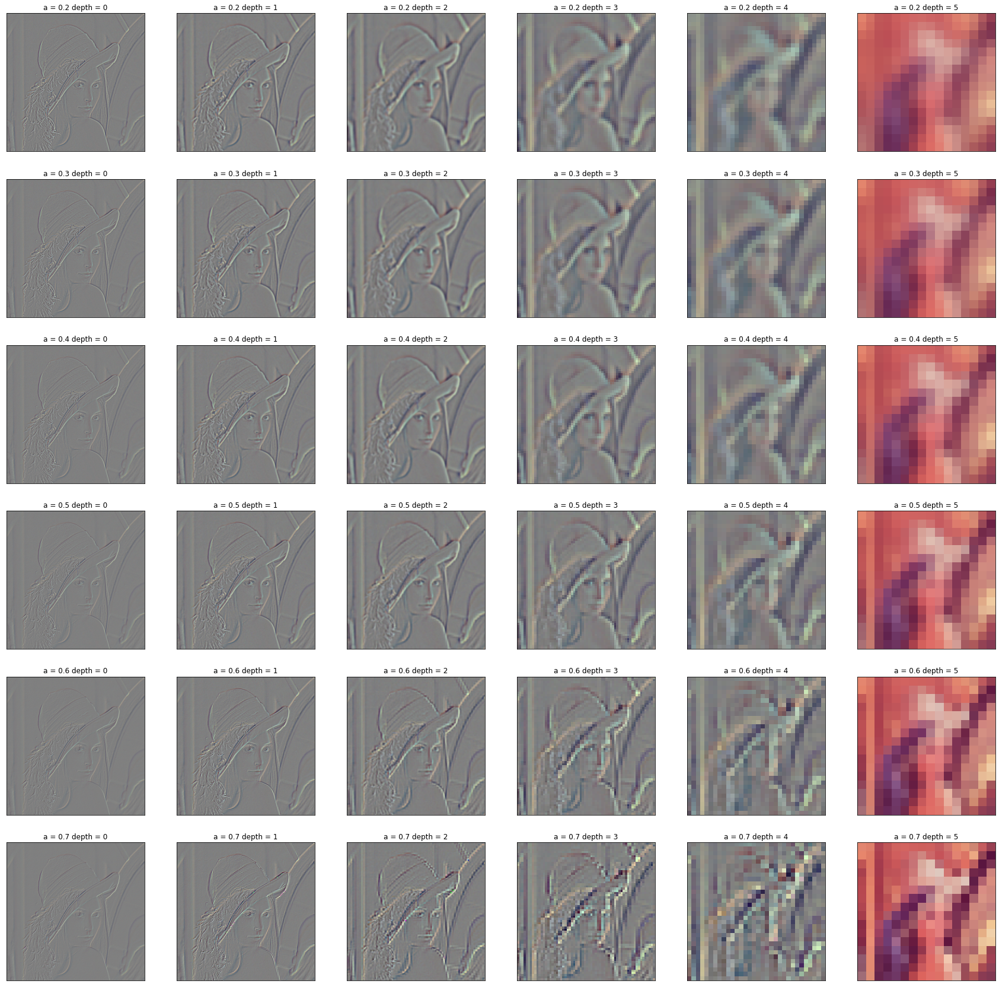

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(alena)):
  for j in range(len(alena[i])):
    plt.subplot(6, 6, i * 6 + j + 1),plt.imshow(alena[i][j]),plt.title("a = " + str(r[i]) +" depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Πυραμίδα αποκωδικοποίησης **Lena**

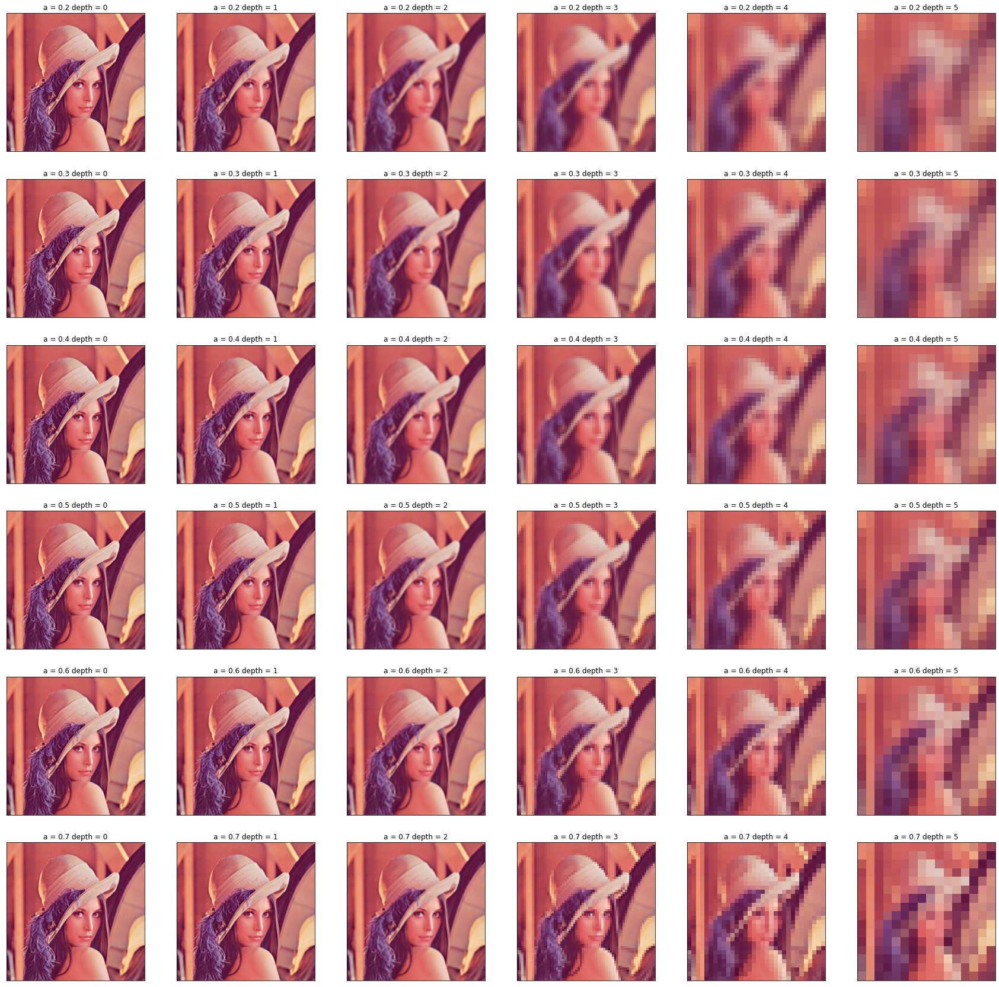

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(alenadec)):
  for j in range(len(alenadec[i])):
    plt.subplot(6, 6, i * 6 + j + 1),plt.imshow(alenadec[i][j]),plt.title("a = " + str(r[i]) +" depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Λαπλασιανή πυραμίδα **Camera**

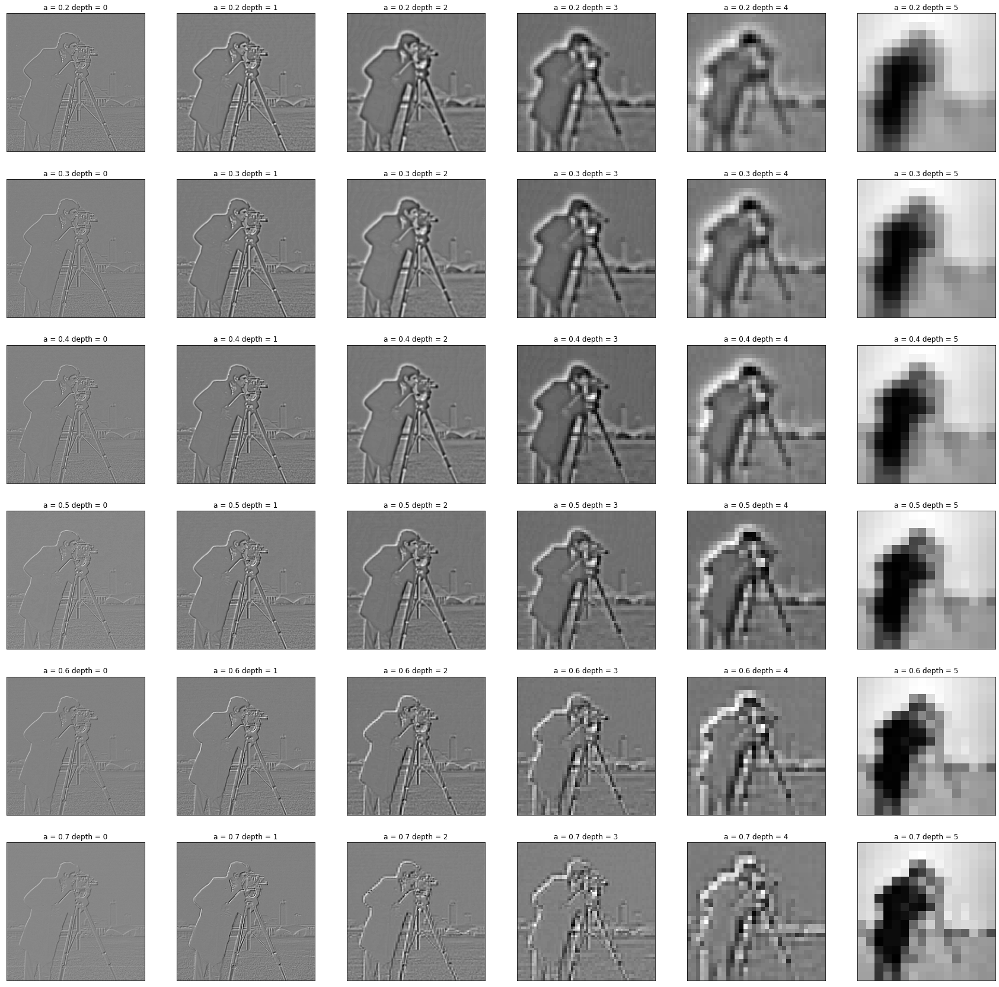

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(acamera)):
  for j in range(len(acamera[i])):
    plt.subplot(6, 6, i * 6 + j + 1),plt.imshow(acamera[i][j], cmap='gray'),plt.title("a = " + str(r[i]) +" depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Πυραμίδα αποκωδικοποίησης **Camera**

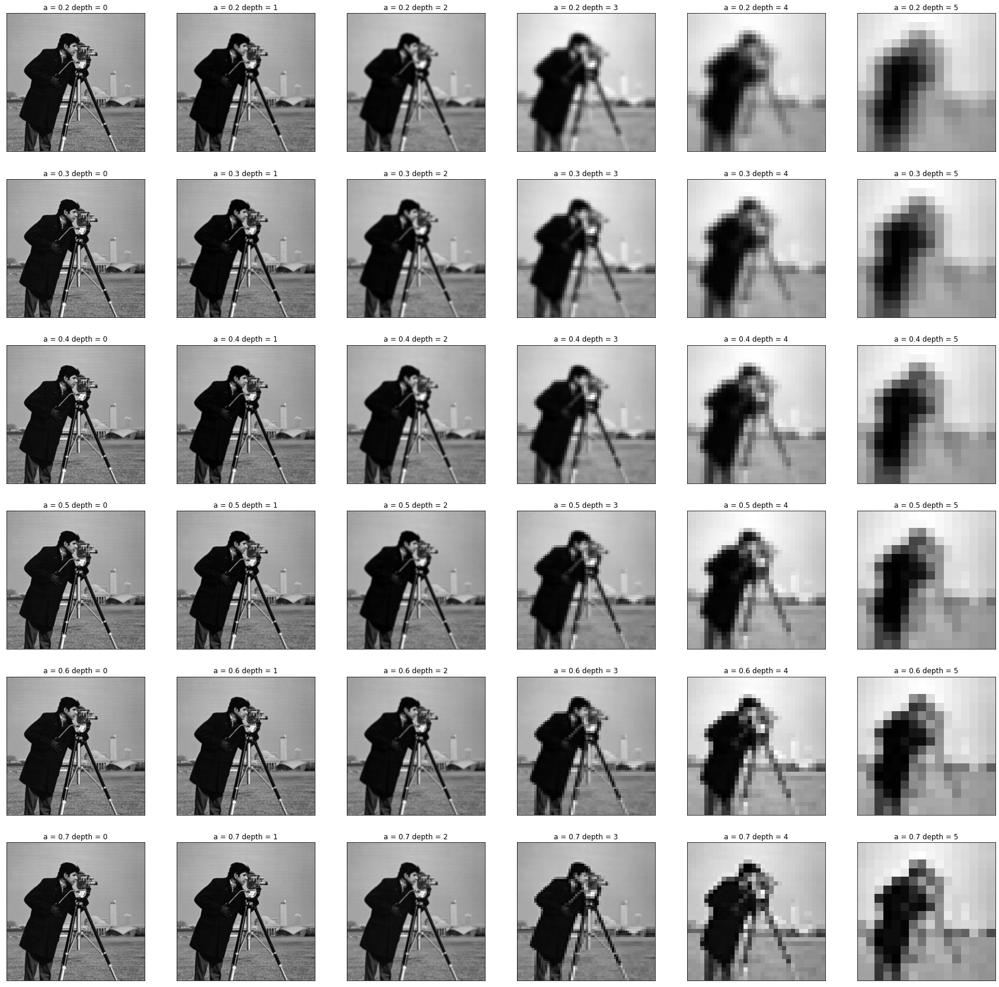

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(acameradec)):
  for j in range(len(acameradec[i])):
    plt.subplot(6, 6, i * 6 + j + 1),plt.imshow(acameradec[i][j], cmap='gray'),plt.title("a = " + str(r[i]) +" depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Σχολιασμός
Απεικονίζεται κάθε στάδιο της αποκωδικοποίησης της Λαπλασιανής πυραμίδας για τις δύο εικόνες. Μπορούμε να παρατηρήσουμε ότι όσο αυξάνεται η τιμή της μεταβλητής $a$ η εικόνα γίνεται πιο καθαρή, ενώ όταν η τιμή είναι μικρή η εικόνα φαίνεται ελαφρώς πιο θολή. Αυτό είναι λογικό, καθώς η αύξηση του $α$ επηρεάζει το $kernel$ με τέτοιο τρόπο ώστε να δίνεται μεγαλύτερη βαρύτητα στα pixel της ίδιας θέσης παρά στα pixels που απέχουν 2 pixels από εκείνο που υπολογίζουμε. Η μείωση του $a$ λοιπόν, κάνει το kernel να έχει συμπεριφορά που θυμίζει ένα $blur$ $kernel$.

####γ) Δοκιμή διαφορετικών $depth$ στο πεδίο $[2-7]$

In [ ]:
d = [2, 3, 4, 5, 6, 7]
depthlena = []
depthcamera = []
depthlenadec = []
depthcameradec = []

for depth in d:
  tmp = LPyramid(img, 0.5, depth)
  depthlena.append(tmp)
  depthlenadec.append(L_Pyramid_Decode(tmp, 0.5))

  tmp = LPyramid(img2, 0.5, depth)
  depthcamera.append(tmp)
  depthcameradec.append(L_Pyramid_Decode(tmp, 0.5))

#####Λαπλασιανή πυραμίδα **Lena**

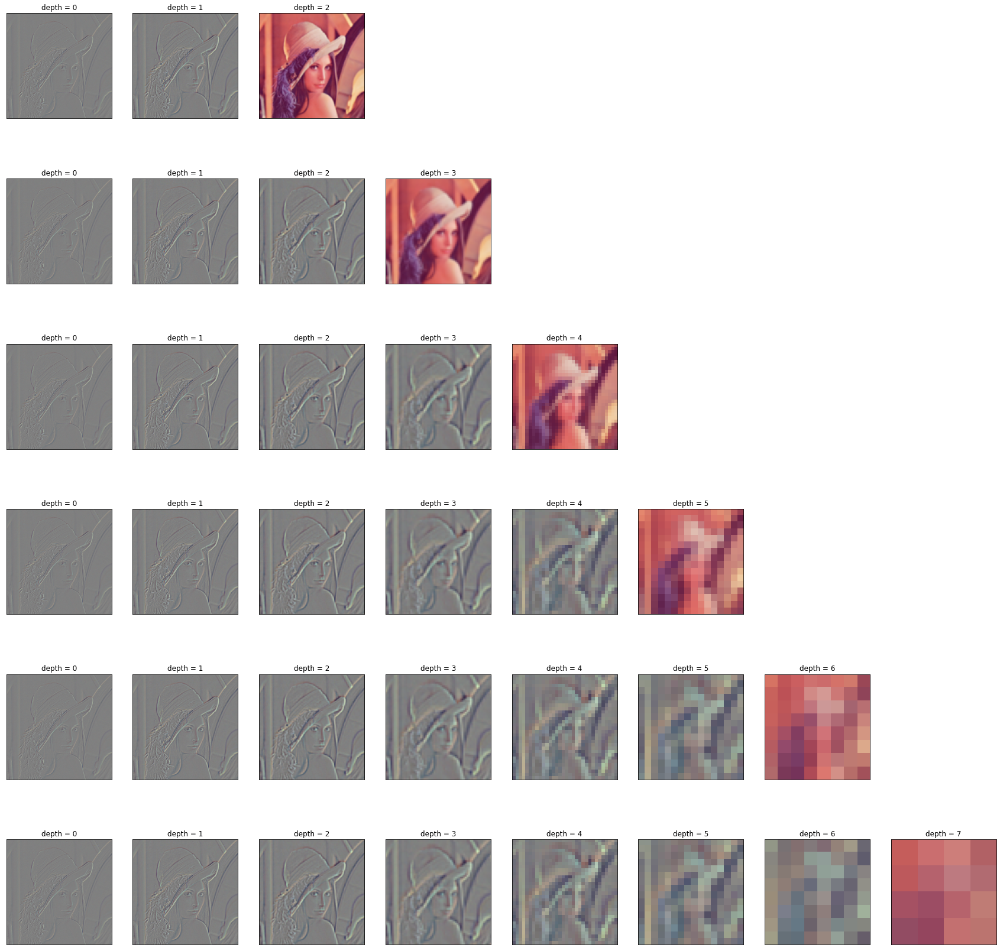

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(depthlena)):
  for j in range(len(depthlena[i])):
    plt.subplot(6, 8, i * 8 + j + 1),plt.imshow(depthlena[i][j]),plt.title("depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Πυραμίδα αποκωδικοποίησης **Lena**

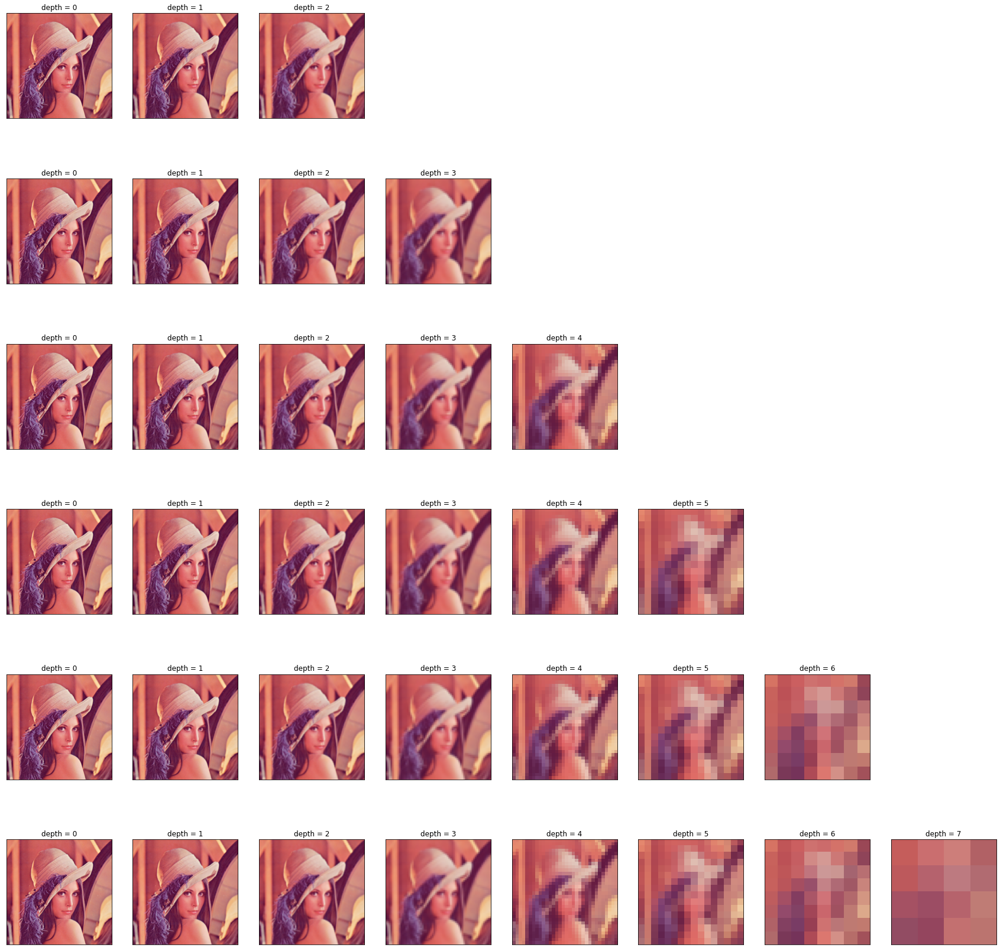

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(depthlenadec)):
  for j in range(len(depthlenadec[i])):
    plt.subplot(6, 8, i * 8 + j + 1),plt.imshow(depthlenadec[i][j]),plt.title("depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Λαπλασιανή Πυραμίδα **Camera**

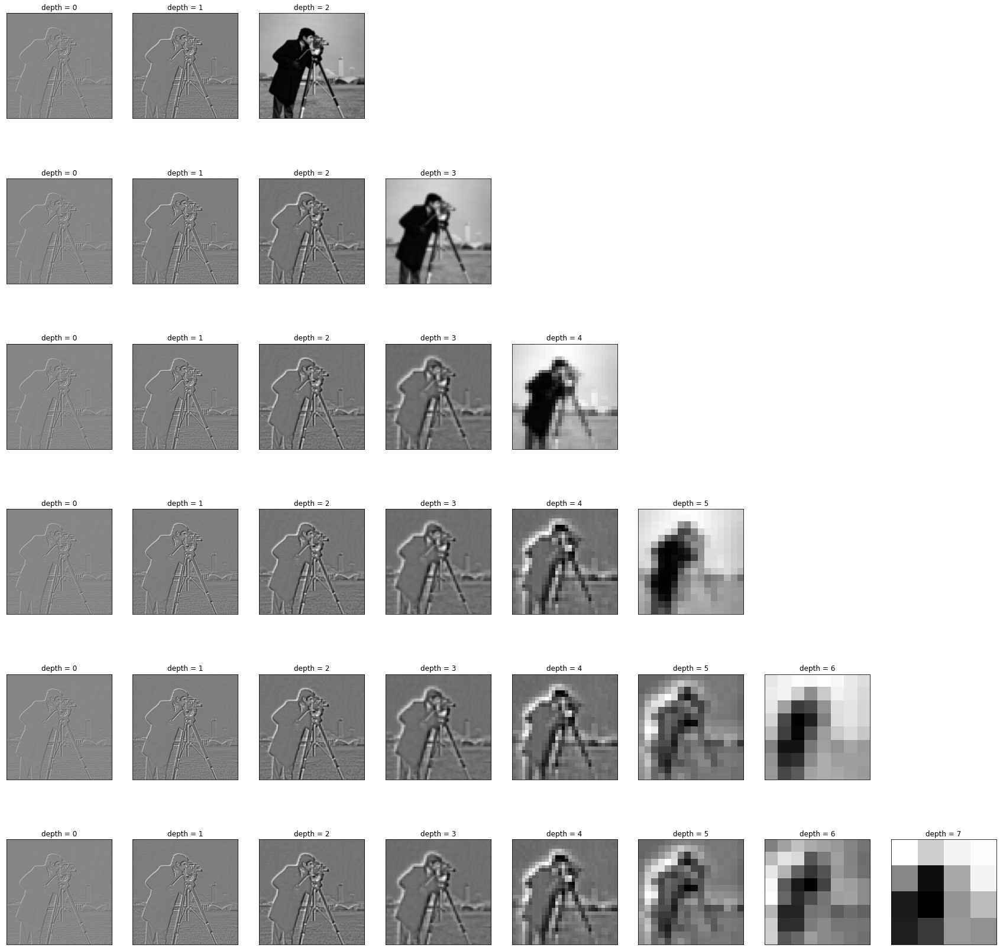

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(depthcamera)):
  for j in range(len(depthcamera[i])):
    plt.subplot(6, 8, i * 8 + j + 1),plt.imshow(depthcamera[i][j], cmap='gray'),plt.title("depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Πυραμίδα αποκωδικοποίησης **Camera**

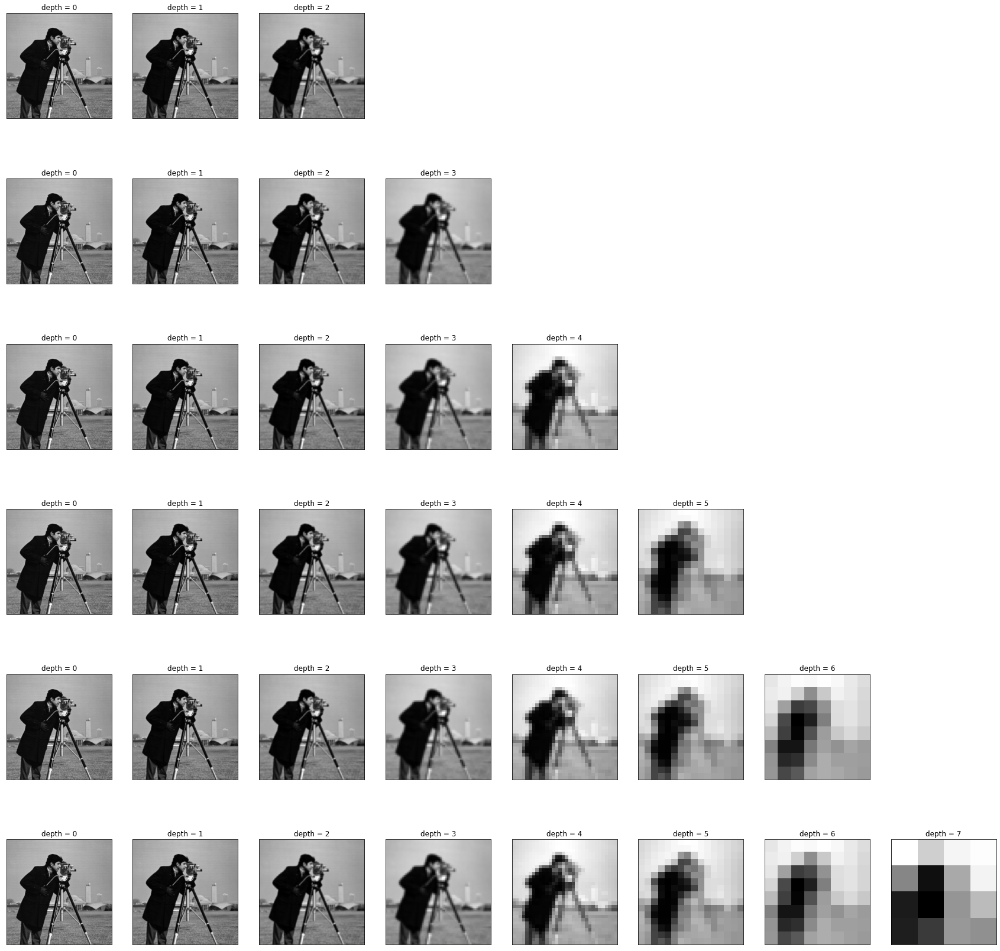

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(depthcameradec)):
  for j in range(len(depthcameradec[i])):
    plt.subplot(6, 8, i * 8 + j + 1),plt.imshow(depthcameradec[i][j], cmap='gray'),plt.title("depth = " + str(j))
    plt.xticks([]), plt.yticks([])

#####Σχολιασμός
Παρατηρούμε ότι η ύπαρξη επιπλέον επιπέδων δεν επηρεάζει τα προηγούμενα επίπεδα. Συνεπώς η μόνη διαφορά της κάθε πυραμίδας αποκωδικοποίησης από την επόμενη είναι η απουσία του τελευταίου επιπέδου. Εν απουσία κβαντοποίησης δεν είναι εμφανής η χρησιμότητα μιας πυραμίδας μεγαλύτερου βάθους, αλλά γίνεται εμφανής αργότερα

####δ) Υπολογισμός εντροπίας και διαγράμματα εντροπίας-$a$ και εντροπίας-$depth$

In [ ]:
from scipy.stats import entropy

def calc_pyr_entr(L):
  sum_hist = np.zeros([256,1], np.float64)
  for i in L:
    split = cv.split(i)
    for s in split:
      hist = cv.calcHist(split, [0], None, [256], [0, 256])
      sum_hist = sum_hist + hist
  return entropy(sum_hist, base=2.0)[0]

In [ ]:
r = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1]
d = [2, 3, 4, 5, 6, 7]

lena_entropy_depth = []
lena_entropy_a = []

camera_entropy_depth = []
camera_entropy_a = []

for a in r:
  temp1 = LPyramid(img, a, 5)
  temp2 = LPyramid(img2, a, 5)

  lena_entropy_a.append(calc_pyr_entr(temp1))
  camera_entropy_a.append(calc_pyr_entr(temp2))

for depth in d:
  temp1 = LPyramid(img, 0.5, depth)
  temp2 = LPyramid(img2, 0.5, depth)

  lena_entropy_depth.append(calc_pyr_entr(temp1))
  camera_entropy_depth.append(calc_pyr_entr(temp2))

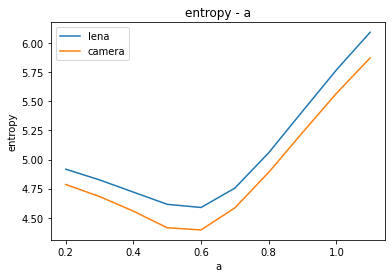

In [ ]:
plt.plot(r, lena_entropy_a, label="lena")
plt.plot(r, camera_entropy_a, label="camera")
plt.title("entropy - a")
plt.xlabel("a")
plt.ylabel("entropy")
plt.legend()
plt.show()

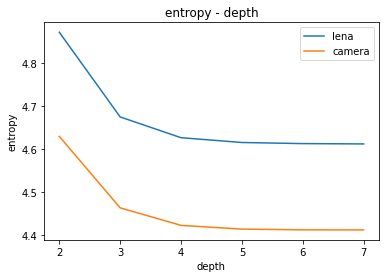

In [ ]:
plt.plot(d, lena_entropy_depth, label="lena")
plt.plot(d, camera_entropy_depth, label="camera")
plt.title("entropy - depth")
plt.xlabel("depth")
plt.ylabel("entropy")
plt.legend()
plt.show()

#####Σχολιασμός
Το πεδίο τιμών του $α$ που δοκιμάστηκε ήταν ελαφρώς μεγαλύτερο από εκείνο που προτάθηκε από την εκφώνηση προκειμένου να δούμε καθαρότερη εικόνα της τάσης που ακολουθεί η μεταβλητή. Συγκεκριμένα βλέπουμε ότι η εντροπία της εικόνας ελαχιστοποιείται στην τιμή $α=0.6$ τόσο για την εικόνα **Lena** όσο και για την **Camera**.

Όσον αφορά την διαφοροποίηση της μεταβλητής $α$ σε σχέση με την τιμή του $depth$ βλέπουμε ότι με κάθε επίπεδο που προστίθεται η εντροπία της πυραμίδας μειώνεται, αλλά παρατηρούμε ότι από το $depth=4$ και μετά η διαφοροποίηση δεν είναι σημαντική. Συμπεραίνουμε ότι το $depth=4$ θα ήταν ο ιδανικός αριθμός για την κατασκευή της πυραμίδας εικόνων που έχουν παρόμοια χαρακτηριστικά με αυτές τις δύο.

Τυχόν αποκλίσεις στα αναμενόμενα δεδομένα, όπως είναι η μορφή της συνάρτησης εντροπίας-βάθος, πιθανό να οφείλονται σε κάποια ατέλεια στην υλοποίηση των συναρτήσεων του paper, ή σε κάποιο συμβιβασμό που έπρεπε να γίνει επειδή η εικόνες δεν πληρούν τις προϋποθέσεις για να γίνουν σωστά γκαουσιανή πυραμίδα (η εικόνα **Lena** έχει διαστάσεις $512x512$ αντί $513x513$ που θα γινόταν τέλεια πυραμίδα)

####ε) Εντοπισμός βέλτιστου $α$

In [ ]:
def entrvar(L):
  #a heuristic for calculating how good a specific value of a is, by calculating the product of the variance and entropy in each depth of a pyramid
  res = 1
  for i in L:
    res = res * np.var(i)
    split = cv.split(i)
    hist = cv.calcHist(split, [0], None, [256], [0, 256])
    res = res * entropy(hist, base=2.0)
  return res[0]

In [ ]:
heur = []
for L in alena:
  heur.append(entrvar(L))
min = np.argmin(heur)
print("The best value for the variable 'a' is " + str(r[min]))

The best value for the variable 'a' is 0.5


#####Σχολιασμός
Παράγουμε μια δική μας ευριστική για τον προσδιορισμό της βέλτιστης τιμής της μεταβλητής $α$ με βάση την *εντροπία* και την *διακύμανση*. Η ευριστική δίνει ένα βαθμό σε κάθε πυραμίδα ο οποίος είναι το γινόμενο της *διακύμανσης* και *εντροπίας* κάθε επιπέδου της πυραμίδας. Με βάση αυτό καταλήγουμε ότι από τις τιμές που μελετήθηκαν παραπάνω η βέλτιστη τιμή είναι $α = 0.5$

####στ) Κβαντισμός εικόνων για βέλτιστο α

In [ ]:
a = r[min]

pyr1 = LPyramid(img, a, 4)
pyr2 = LPyramid(img2, a, 4)

quantz1 = []
quantz2 = []

bins = [10, 20, 30]

for q in bins:
  tmp = L_Quantization(pyr1, q)
  quantz1.append(tmp)

  tmp = L_Quantization(pyr2, q)
  quantz2.append(tmp)

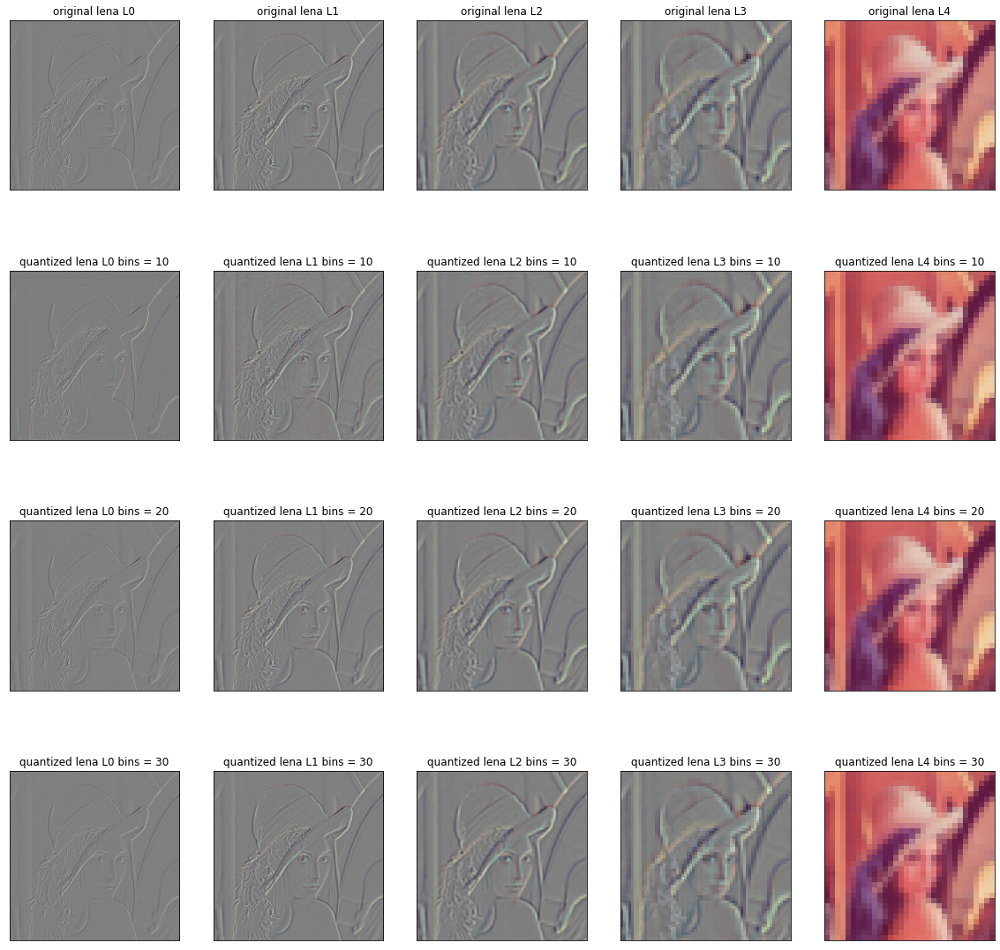

In [ ]:
plt.figure(figsize=(20,20))

for i in range(5):
  plt.subplot(4, 5, i + 1),plt.imshow(pyr1[i]),plt.title("original lena L" + str(i))
  plt.xticks([]), plt.yticks([])

for i in range(len(quantz1)):
  for j in range(len(quantz1[0])):
    plt.subplot(4, 5, (i + 1) * 5 + j + 1),plt.imshow(quantz1[i][j]),plt.title("quantized lena L" + str(j) + " bins = " + str(bins[i]))
    plt.xticks([]), plt.yticks([])

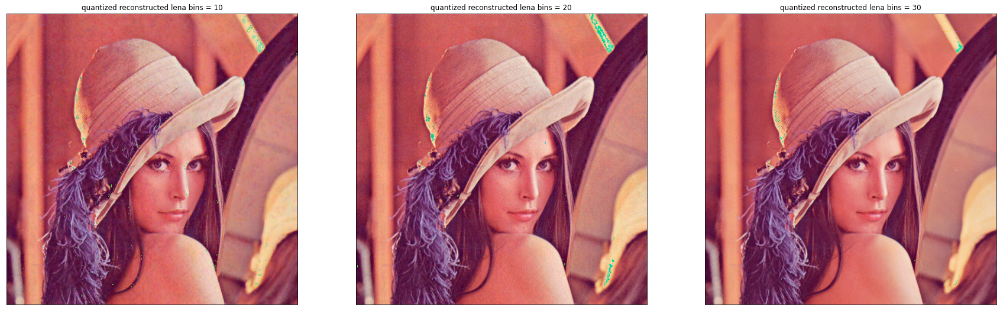

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(quantz1)):
  dec = L_Pyramid_Decode(quantz1[i], a)
  plt.subplot(1, 3, i + 1),plt.imshow(dec[0]),plt.title("quantized reconstructed lena bins = " + str(bins[i]))
  plt.xticks([]), plt.yticks([])

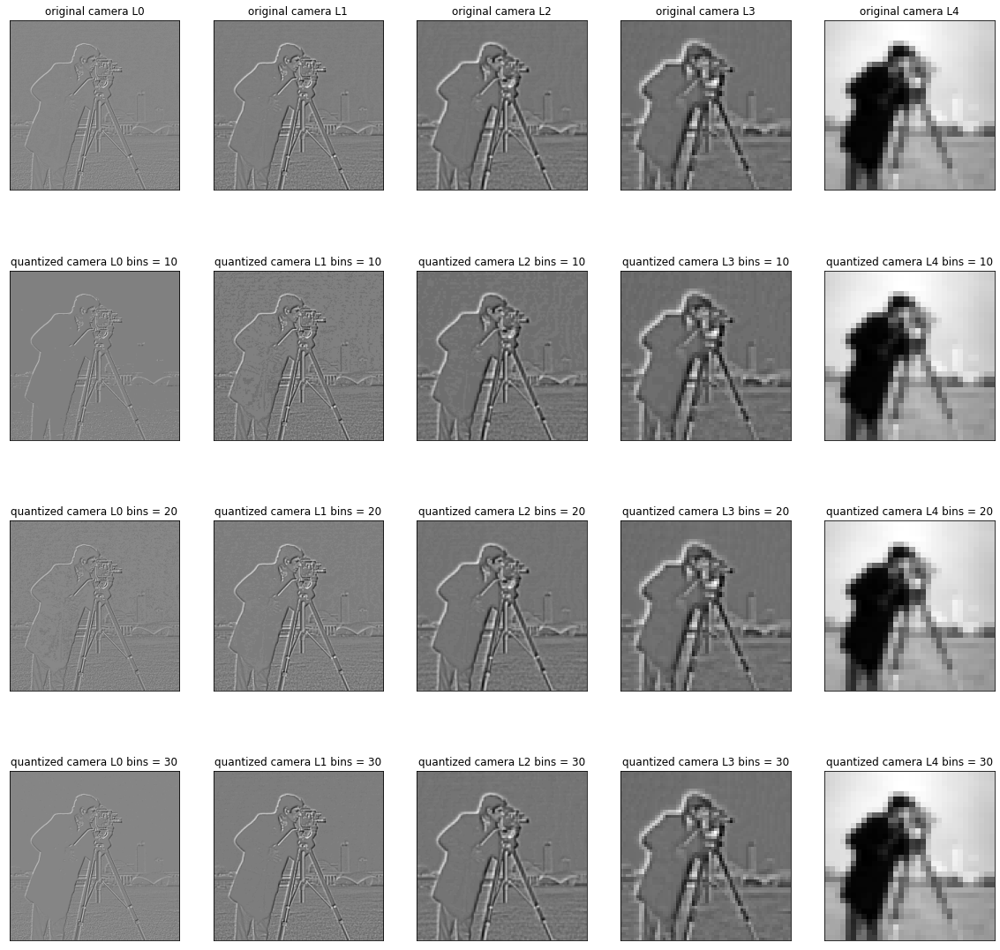

In [ ]:
plt.figure(figsize=(20,20))

for i in range(5):
  plt.subplot(4, 5, i + 1),plt.imshow(pyr2[i], cmap='gray'),plt.title("original camera L" + str(i))
  plt.xticks([]), plt.yticks([])

for i in range(len(quantz2)):
  for j in range(len(quantz2[0])):
    plt.subplot(4, 5, (i + 1) * 5 + j + 1),plt.imshow(quantz2[i][j], cmap='gray'),plt.title("quantized camera L" + str(j) + " bins = " + str(bins[i]))
    plt.xticks([]), plt.yticks([])

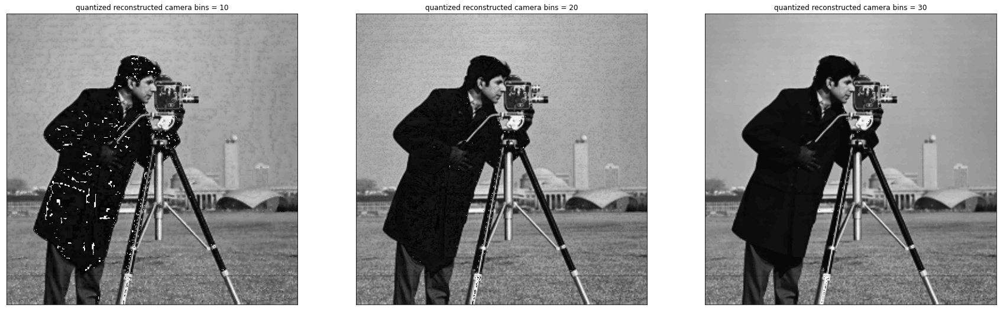

In [ ]:
plt.figure(figsize=(30,30))
for i in range(len(quantz2)):
  dec = L_Pyramid_Decode(quantz2[i], a)
  plt.subplot(1, 3, i + 1),plt.imshow(dec[0], cmap='gray'),plt.title("quantized reconstructed camera bins = " + str(bins[i]))
  plt.xticks([]), plt.yticks([])

#####Σχολιασμός
Η διαφορά των εικόνων της λαπλασιανής πυραμίδας πριν και μετά από τη κβάντωση δεν είναι εύκολα εμφανής στο μάτι. Μπορούμε όμως να διακρίνουμε τις ατέλειες στην decoded εικόνες. Παίρνουν την μορφή άσπρων ή λευκών pixel τα οποία φαίνονται να συγκεντρώνονται στα περιγράμματα της εικόνας. Αυτό το φαινόμενο είναι αναμενόμενο, καθώς η κβάντωση έγινε στις εικόνες της λαπλασιανής πυραμίδας, η οποία απεικονίζει σε μεγάλο βαθμό τα περιγράμματα των αντικειμένων της εικόνας.

####ζ) Υπολογισμός SNR

In [ ]:
def compute_psnr(img1, img2):
  img1 = img1.astype(np.float64) / 255.
  img2 = img2.astype(np.float64) / 255.
  mse = np.mean((img1 - img2) ** 2)
  if mse == 0:
    snr12=0
  snr12=10 * math.log10(1. / mse)
  return snr12

In [ ]:
snr1 = []
snr2 = []

for q in quantz1:
  snr1.append(compute_psnr(img, L_Pyramid_Decode(q, a)[0]))

for q in quantz2:
  snr2.append(compute_psnr(img2, L_Pyramid_Decode(q, a)[0]))

print("--- Lena ---")
for i in range(3):
  print("For bins =", bins[i], ", PSNR =", snr1[i])

print("--- Camera ---")
for i in range(3):
  print("For bins =", bins[i], ", PSNR =", snr2[i])

--- Lena ---
For bins = 10 , PSNR = 29.710645766585824
For bins = 20 , PSNR = 29.33097978116121
For bins = 30 , PSNR = 34.278214199524385
--- Camera ---
For bins = 10 , PSNR = 21.797620900967246
For bins = 20 , PSNR = 30.057702276690005
For bins = 30 , PSNR = 35.10916343529586


#####Σχολιασμός
Στα 3 πειράματα που κάναμε δώσαμε τιμές των bins ίσες με $10$, $20$ και $30$. Αυτός είναι ο αριθμός των bins στα οποία χωρίστηκε το διάστημα $[0-255]$ και όχι το μήκος του κάθε bin. Ξεκινάμε κάθε φορά με την παραπάνω τιμή στο επίπεδο 0 και σε κάθε επίπεδο διπλασιάζουμε τον αριθμό των bins, μέχρι ένα άνω όριο. Αυτή η τακτική χρησιμοποιήθηκε ακολουθώντας τις οδηγίες του paper των **Burt** και **Anderson**, καθώς επισημάνθηκε ότι στα χαμηλά επίπεδα τις πυραμίδας το μάτι είναι λιγότερο ευαίσθητο οπότε μπορεί να γίνει πιο δραστική κβάντωση, ενώ στα υψηλότερα επίπεδα το ανθρώπινο μάτι είναι πιο ευαίσθητο στις αλλαγές.

Για την εικόνα **Lena** παρατηρούμε ότι για τις τρεις τιμές των bins η αλλαγή του *PSNR* δεν είναι γραμμική. Από την τιμή $10$ στην τιμή $20$ η διαφορά είναι μικρή, ενώ από την τιμή $20$ στην τιμή $30$ η διαφορά είναι σημαντικά μεγαλύτερη. Μπορούμε να δούμε από τις αποκωδικοποιημένες εικόνες ότι η μεγαλύτερη τιμή του *PNSR* συνεπάγεται λιγότερα σφάλματα στην εικόνα, τα οποία παίρνουν την μορφή πράσινων ή λευκών pixels.

Από τις τιμές αυτές μπορούμε να συμπεράνουμε ότι η τιμή των $20$ bins είναι μία μη συμφέρουσα τιμή κβάντωσης της πυραμίδας. Για μικρό κόστος ποιότητας μπορούμε να διπλασιάσουμε την κβάντωση της πυραμίδας. Συνεπώς είναι πιο συμφέρον να επιλέξει κάποιος είτε την τιμή $30$ για μεγαλύτερη ποιότητα της φωτογραφίας ή την τιμή $10$ για μια πιο χαμηλή ποιότητα με σημαντικό κέρδος μνήμης

Αντιθέτως για την φωτογραφία **Camera** βλέπουμε ότι αυτή τη φορά το διάστημα $10-20$ έχει μεγαλύτερη αύξηση *PNSR* από ό,τι το διάστημα $20-30$. Μπορούμε να συμπεράνουμε έτσι ότι αυτή τη φορά η τιμή $10$ δεν είναι συμφέρουσα τιμή, καθώς διπλασιάζοντας την κβάντωση, έχουμε πολύ μεγάλο κόστος στην ποιότητα της φωτογραφίας. Αυτό το κόστος γίνεται φανερό και άμα παρατηρήσουμε τις ανακατασκευασμένες φωτογραφίες, βλέπουμε ότι για $20$ και $30$ bins η ανακατασκευή είναι πολύ ποιοτική, ενώ για την τιμή $10$ είναι εμφανής η πτώση της ποιότητας.